<a href="https://colab.research.google.com/github/NoorFatimaMemon/DeepLearning/blob/main/27_GAN_Image_Generation/27_PixPix_Adversial_Network_in_GANS%60.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Pix2Pix with Edges2Shoes Dataset**
**Goal**:
- Learn to translate a "sketch of a shoe" (edges) into a "realistic shoe photo"
- This is called **image-to-image translation** using a type of GAN called **Pix2Pix**.

Pix2Pix = 2 models fighting:
1. Generator: creates fake shoe photos from sketches
2. Discriminator: checks if shoe photo is real or fake
Both improve together!

In [1]:
# Import Libraries
import tensorflow as tf
import os
import time
from matplotlib import pyplot as plt
from IPython import display
from tqdm import tqdm

In [2]:
# Download Dataset
# We use "edges2shoes" dataset (sketch -> shoe photo).
# Each image is split into LEFT (real shoe) + RIGHT (edges).
_URL = 'http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/edges2shoes.tar.gz'
path_to_zip = tf.keras.utils.get_file('edges2shoes.tar.gz', origin=_URL, extract=True)

2165283376/2165283376 ━━━━━━━━━━━━━━━━━━━━ 2243s 1us/step


In [21]:
base_dir = "/root/.keras/datasets"
print("Contents of datasets folder:", os.listdir(base_dir))

Contents of datasets folder: ['edges2shoes.tar.gz', 'edges2shoes_extracted']


In [22]:
print("Inside edges2shoes_extracted:", os.listdir("/root/.keras/datasets/edges2shoes_extracted"))

Inside edges2shoes_extracted: ['edges2shoes']


In [4]:
PATH = "/root/.keras/datasets/edges2shoes_extracted/edges2shoes/"

In [5]:
# Set Parameters
BUFFER_SIZE = 400   # how many images to shuffle when training
BATCH_SIZE = 1      # 1 image at a time (Pix2Pix works well with this)
IMG_WIDTH = 256     # final image width
IMG_HEIGHT = 256    # final image height

In [6]:
# Load and Split Images
def load(image_file):
  # Read and decode image
  image = tf.io.read_file(image_file)
  image = tf.image.decode_jpeg(image)

  # Split into two halves (sketch + photo)
  w = tf.shape(image)[1] // 2
  real_image = image[:, w:, :]     # right  side: real shoe photo
  input_image = image[:, :w, :]   #  left side: shoe edges/sketch

  # Convert to float
  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

In [7]:
# Resize and Normalize
def resize(image, height, width):
    return tf.image.resize(image, [height, width])

def normalize(input_image, real_image):
  """Scale pixel values from [0,255] → [-1,1]. Why? NNs train faster and more stable in small ranges.
  """
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1
  return input_image, real_image

In [8]:
# Data Augmentation
def random_crop(input_image, real_image):
  """Randomly crop image (adds variety, prevents overfitting)."""
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])
  return cropped_image[0], cropped_image[1]

@tf.function()
def random_jitter(input_image, real_image):
  """Random Jitter = (small tricks to make training robust)"""
  # Resize to slightly bigger image
  input_image = resize(input_image, 286, 286)
  real_image = resize(real_image, 286, 286)
  # Random crop to target size (256x256)
  input_image, real_image = random_crop(input_image, real_image)
  # Random flip (mirror image)
  if tf.random.uniform(()) > 0.5:
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)
  return input_image, real_image

In [9]:
# Training & Test Loading
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)
  return input_image, real_image

def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image = resize(input_image, IMG_HEIGHT, IMG_WIDTH)
  real_image = resize(real_image, IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)
  return input_image, real_image

In [10]:
# Datasets
# Train dataset
train_dataset = tf.data.Dataset.list_files(PATH + 'train/*.jpg')
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)
train_dataset = train_dataset.cache().prefetch(tf.data.AUTOTUNE)
train_dataset = train_dataset.take(100)   # limit dataset for faster debugging

# Test dataset
test_dataset = tf.data.Dataset.list_files(PATH + 'val/*.jpg')
test_dataset = test_dataset.map(load_image_test, num_parallel_calls=tf.data.AUTOTUNE)
test_dataset = test_dataset.batch(BATCH_SIZE)
test_dataset = test_dataset.cache().prefetch(tf.data.AUTOTUNE)

In [11]:
# Build Generator (U-Net)
"""Generator = U-Net
    - Encoder (downsample): Shrinks image, captures abstract info
    - Decoder (upsample): Expands image back to full size
    - Skip connections: pass details from encoder → decoder (prevents blurry outputs)
"""
OUTPUT_CHANNELS = 3  # RGB output

def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)
  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False))
  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())
  result.add(tf.keras.layers.LeakyReLU())
  return result

def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)
  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False))
  result.add(tf.keras.layers.BatchNormalization())
  if apply_dropout:
    result.add(tf.keras.layers.Dropout(0.5))
  result.add(tf.keras.layers.ReLU())
  return result

def Generator():
  inputs = tf.keras.layers.Input(shape=[256,256,3])
  # Encoder (downsample layers)
  down_stack = [downsample(64, 4, apply_batchnorm=False), downsample(128, 4), downsample(256, 4), downsample(512, 4), downsample(512, 4),
                downsample(512, 4), downsample(512, 4), downsample(512, 4),]

  # Decoder (upsample layers)
  up_stack = [upsample(512, 4, apply_dropout=True), upsample(512, 4, apply_dropout=True), upsample(512, 4, apply_dropout=True),
              upsample(512, 4), upsample(256, 4), upsample(128, 4),upsample(64, 4),]

  # Last layer outputs an RGB image
  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4, strides=2, padding='same', kernel_initializer=initializer, activation='tanh')

  # Forward pass
  x = inputs
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)
  skips = reversed(skips[:-1])
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])
  x = last(x)
  return tf.keras.Model(inputs=inputs, outputs=x)

generator = Generator()

In [12]:
# Build Discriminator (PatchGAN)
"""Discriminator = PatchGAN
    - Instead of judging whole image, it judges small patches (30x30).
    - This forces generator to create *local realistic details* (textures, edges).
"""
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)
  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')
  x = tf.keras.layers.concatenate([inp, tar])
  down1 = downsample(64, 4, False)(x)
  down2 = downsample(128, 4)(down1)
  down3 = downsample(256, 4)(down2)
  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)(zero_pad1)
  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)
  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)
  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)
  last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2)
  return tf.keras.Model(inputs=[inp, tar], outputs=last)

discriminator = Discriminator()

In [13]:
# Loss Functions
"""GAN Loss:
    - Generator wants discriminator to think "fake is real"
    - Discriminator wants to separate "real vs fake"
  Extra L1 Loss:
    - Generator also punished if fake shoe is structurally different from real one
    - Keeps outputs close to target image
"""
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)
LAMBDA = 100  # weight for L1 loss

def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
  total_gen_loss = gan_loss + (LAMBDA * l1_loss)
  return total_gen_loss, gan_loss, l1_loss

def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
  return real_loss + generated_loss

In [14]:
# Optimizers & Checkpoints
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer, discriminator_optimizer=discriminator_optimizer,
                                 generator=generator, discriminator=discriminator)

In [15]:
# Generate Images (visualize)
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))
  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input (Sketch)', 'Ground Truth (Photo)', 'Generated (Fake Photo)']
  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    plt.imshow((display_list[i] * 0.5 + 0.5))  # back to [0,1] range
    plt.axis('off')
  plt.show()

In [16]:
# Training Step
@tf.function
def train_step(input_image, target, epoch):
  """One training step:
       1. Generator creates fake photo
       2. Discriminator checks both real & fake
       3. Compute losses
       4. Update weights
  """
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)
    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)
    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)
  generator_gradients = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
  generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

In [17]:
# Training Loop
def fit(train_ds, epochs, test_ds):
  for epoch in range(epochs):
    start = time.time()
    # display.clear_output(wait=True)

    # Show sample output
    for example_input, example_target in test_ds.take(1):
      generate_images(generator, example_input, example_target)

    print("Epoch:", epoch + 1)

    # Train over all data with tqdm progress bar
    for n, (input_image, target) in enumerate(tqdm(train_ds, desc=f"Epoch {epoch+1}")):
      train_step(input_image, target, epoch)

    # Save checkpoints every 20 epochs
    if (epoch + 1) % 20 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

    print('Time for epoch {} is {} sec\n'.format(epoch+1, time.time()-start))

  checkpoint.save(file_prefix=checkpoint_prefix)

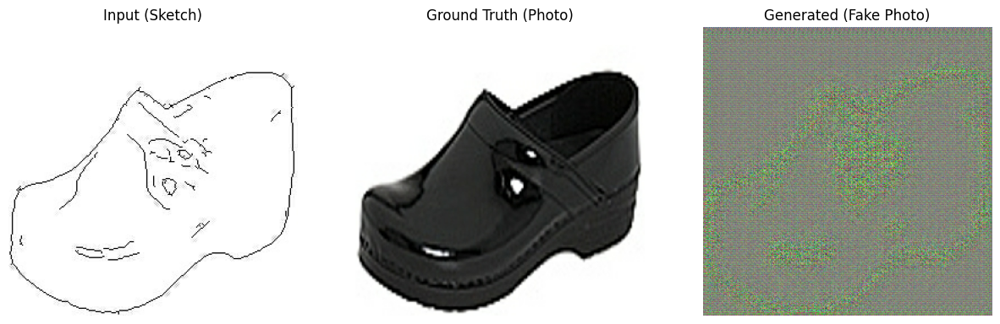

Epoch: 1


Epoch 1: 100%|██████████| 100/100 [00:22<00:00,  4.40it/s]


Time for epoch 1 is 27.88133978843689 sec



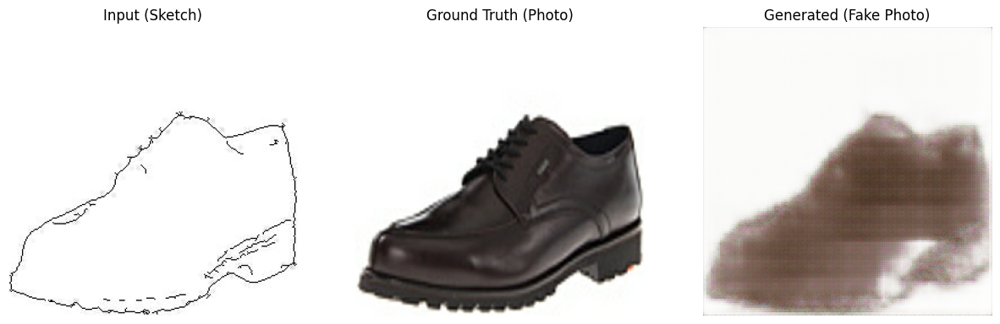

Epoch: 2


Epoch 2: 100%|██████████| 100/100 [00:15<00:00,  6.43it/s]


Time for epoch 2 is 15.951365947723389 sec



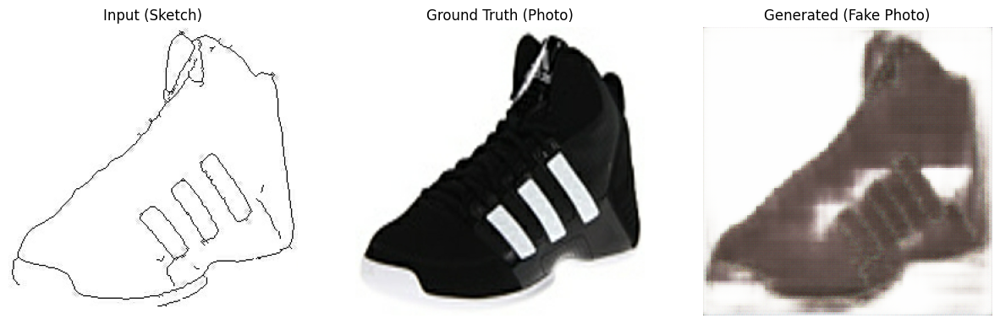

Epoch: 3


Epoch 3: 100%|██████████| 100/100 [00:16<00:00,  6.17it/s]


Time for epoch 3 is 16.86448383331299 sec



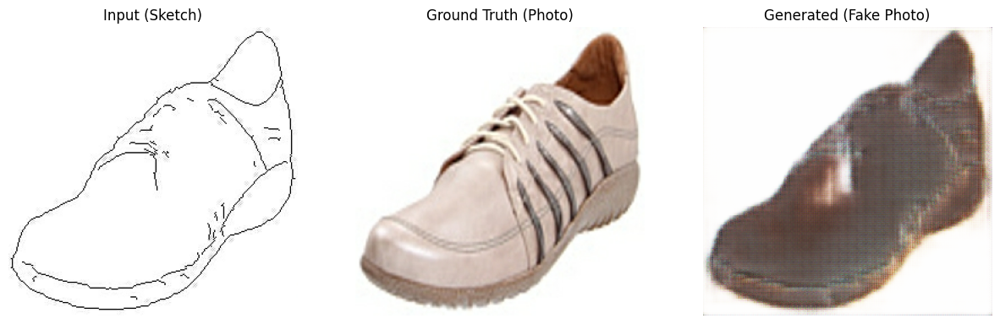

Epoch: 4


Epoch 4: 100%|██████████| 100/100 [00:15<00:00,  6.47it/s]


Time for epoch 4 is 15.876614332199097 sec



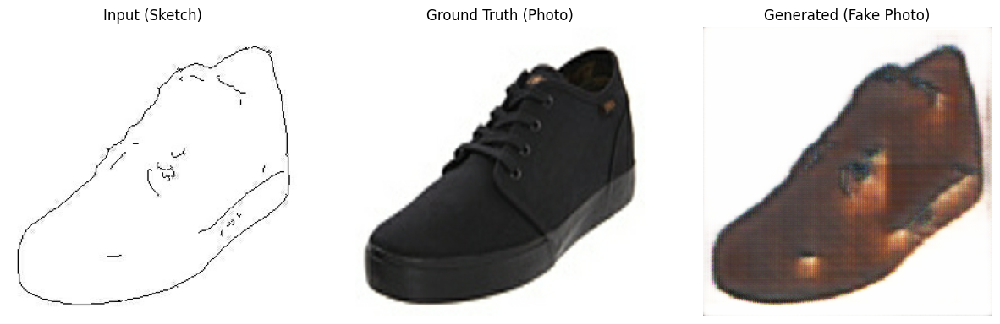

Epoch: 5


Epoch 5: 100%|██████████| 100/100 [00:15<00:00,  6.39it/s]


Time for epoch 5 is 16.040040731430054 sec



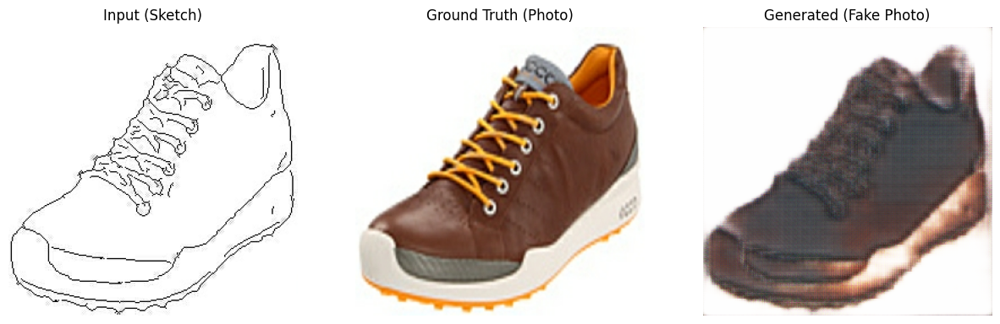

Epoch: 6


Epoch 6: 100%|██████████| 100/100 [00:16<00:00,  6.17it/s]


Time for epoch 6 is 16.880093574523926 sec



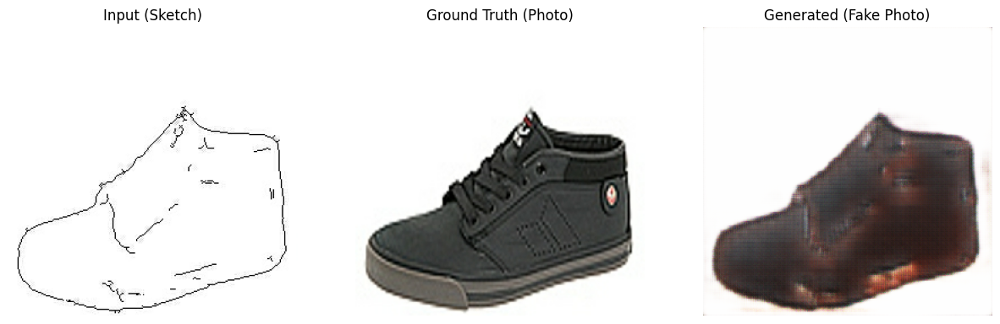

Epoch: 7


Epoch 7: 100%|██████████| 100/100 [00:15<00:00,  6.28it/s]


Time for epoch 7 is 16.53723430633545 sec



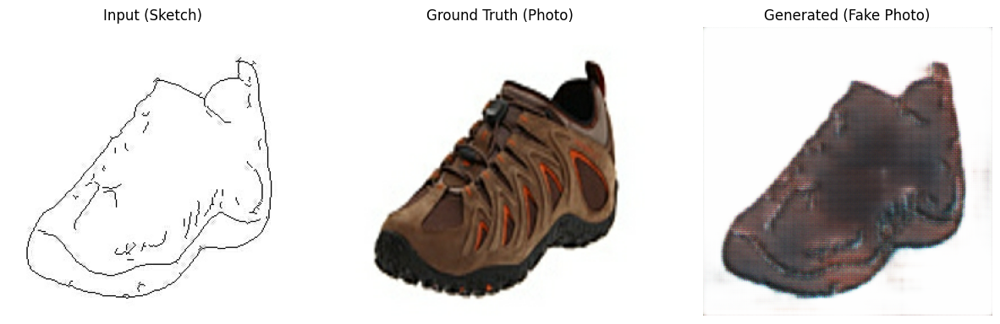

Epoch: 8


Epoch 8: 100%|██████████| 100/100 [00:15<00:00,  6.41it/s]


Time for epoch 8 is 16.28304886817932 sec



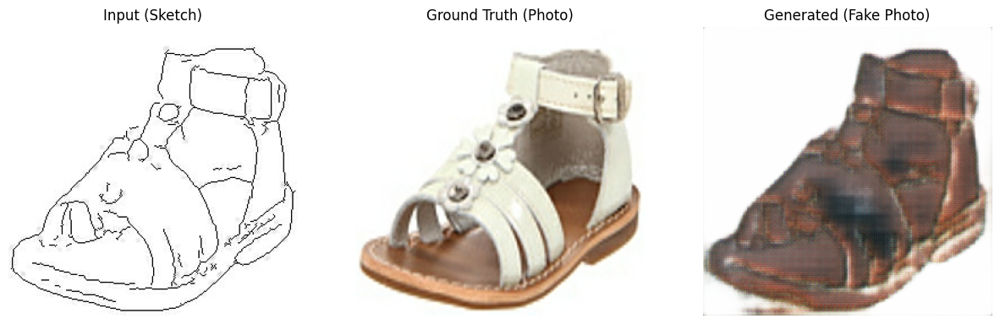

Epoch: 9


Epoch 9: 100%|██████████| 100/100 [00:16<00:00,  6.04it/s]


Time for epoch 9 is 17.254148483276367 sec



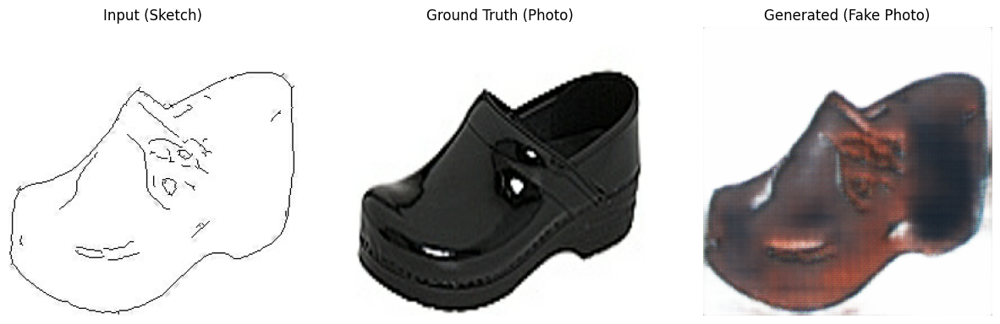

Epoch: 10


Epoch 10: 100%|██████████| 100/100 [00:15<00:00,  6.27it/s]


Time for epoch 10 is 16.625402450561523 sec



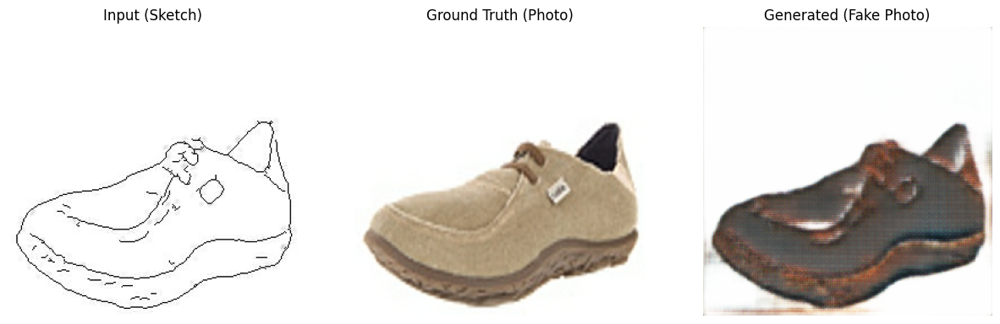

Epoch: 11


Epoch 11: 100%|██████████| 100/100 [00:15<00:00,  6.34it/s]


Time for epoch 11 is 16.42828893661499 sec



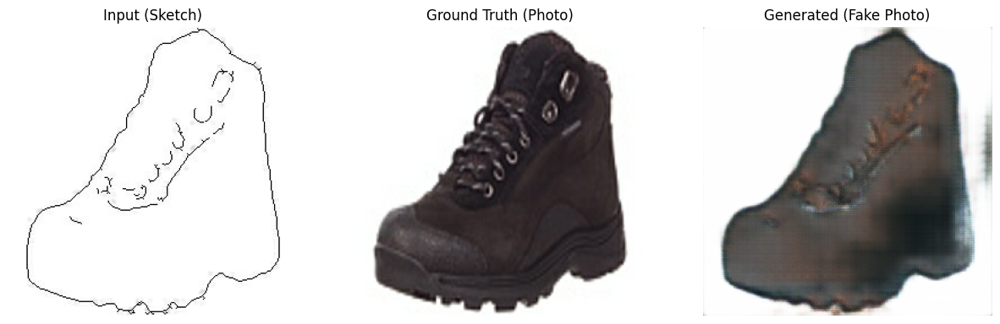

Epoch: 12


Epoch 12: 100%|██████████| 100/100 [00:16<00:00,  5.89it/s]


Time for epoch 12 is 17.43245267868042 sec



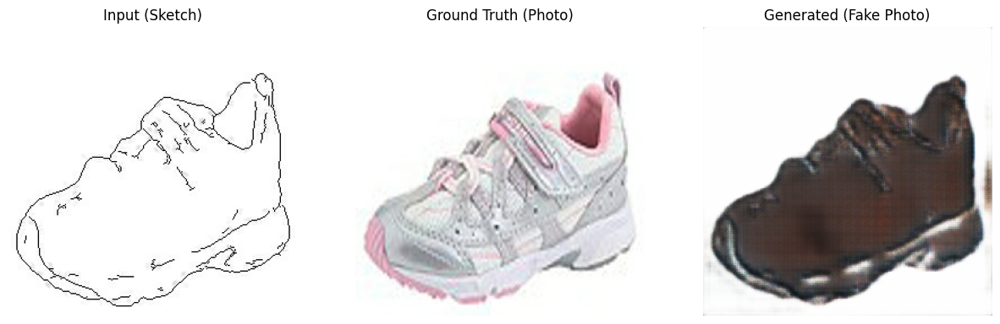

Epoch: 13


Epoch 13: 100%|██████████| 100/100 [00:16<00:00,  6.24it/s]


Time for epoch 13 is 16.70234251022339 sec



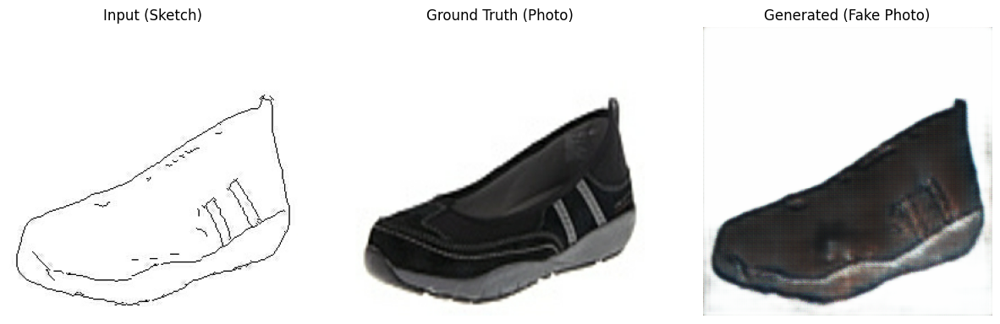

Epoch: 14


Epoch 14: 100%|██████████| 100/100 [00:15<00:00,  6.37it/s]


Time for epoch 14 is 16.365290641784668 sec



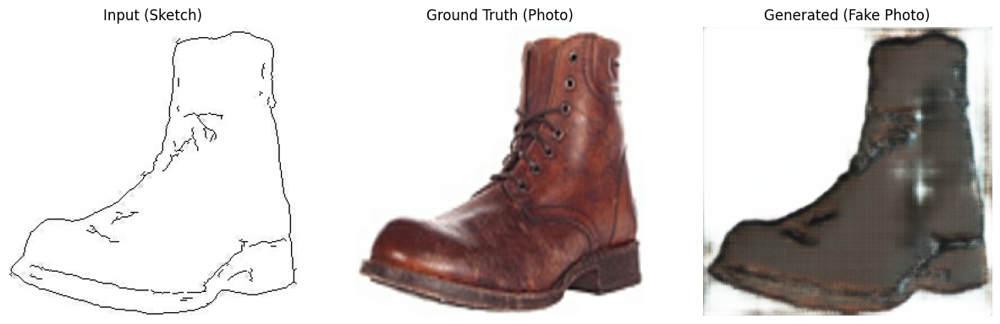

Epoch: 15


Epoch 15: 100%|██████████| 100/100 [00:16<00:00,  6.18it/s]


Time for epoch 15 is 16.685702800750732 sec



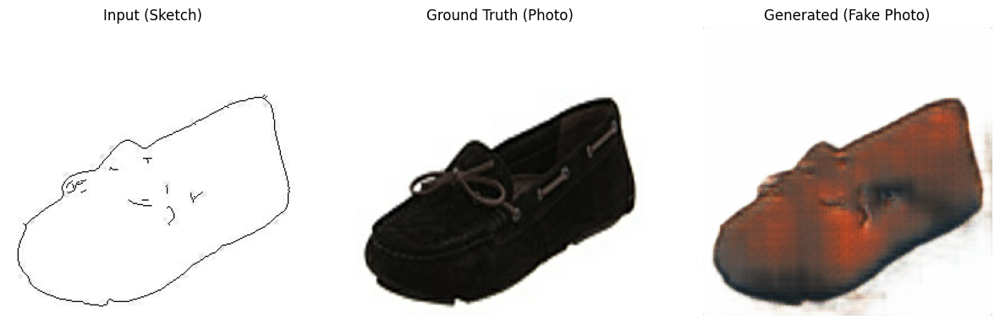

Epoch: 16


Epoch 16: 100%|██████████| 100/100 [00:16<00:00,  6.00it/s]


Time for epoch 16 is 17.328057289123535 sec



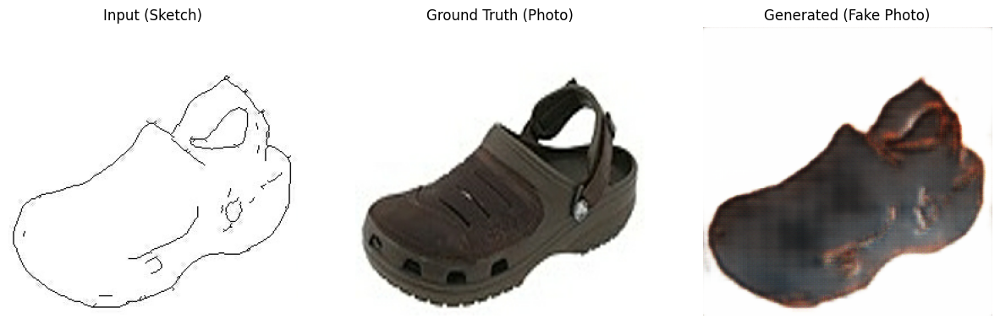

Epoch: 17


Epoch 17: 100%|██████████| 100/100 [00:16<00:00,  6.04it/s]


Time for epoch 17 is 17.224361896514893 sec



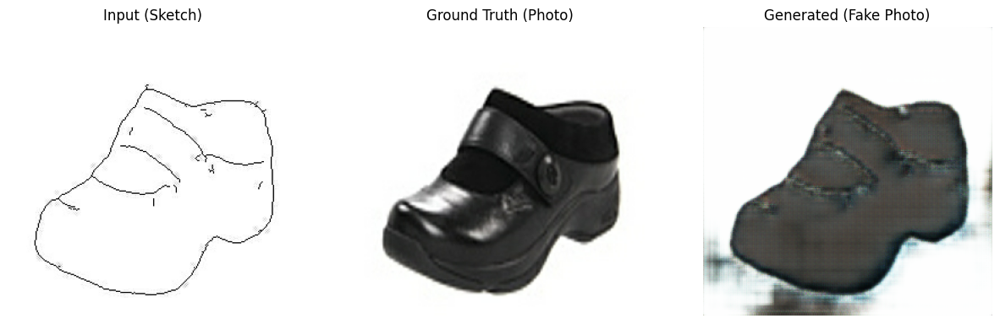

Epoch: 18


Epoch 18: 100%|██████████| 100/100 [00:20<00:00,  4.89it/s]


Time for epoch 18 is 20.988728284835815 sec



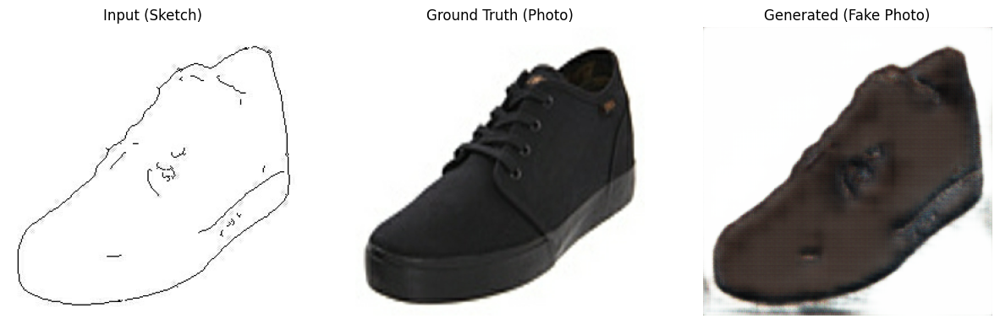

Epoch: 19


Epoch 19: 100%|██████████| 100/100 [00:15<00:00,  6.35it/s]


Time for epoch 19 is 16.41080594062805 sec



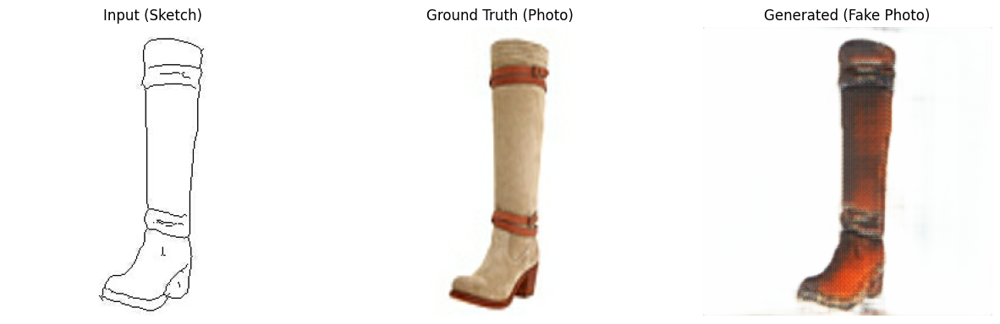

Epoch: 20


Epoch 20: 100%|██████████| 100/100 [00:16<00:00,  5.89it/s]


Time for epoch 20 is 20.778110027313232 sec



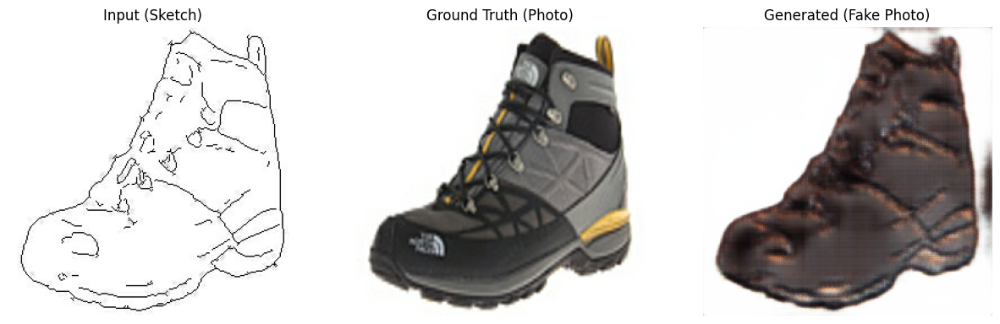

Epoch: 21


Epoch 21: 100%|██████████| 100/100 [00:15<00:00,  6.27it/s]


Time for epoch 21 is 16.36377739906311 sec



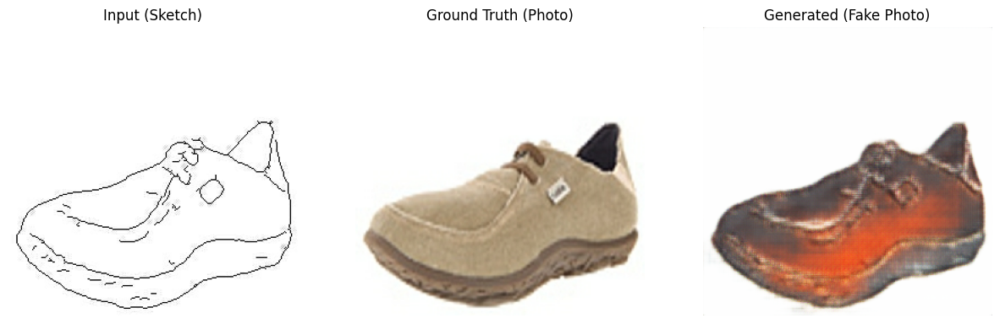

Epoch: 22


Epoch 22: 100%|██████████| 100/100 [00:16<00:00,  6.00it/s]


Time for epoch 22 is 17.33598566055298 sec



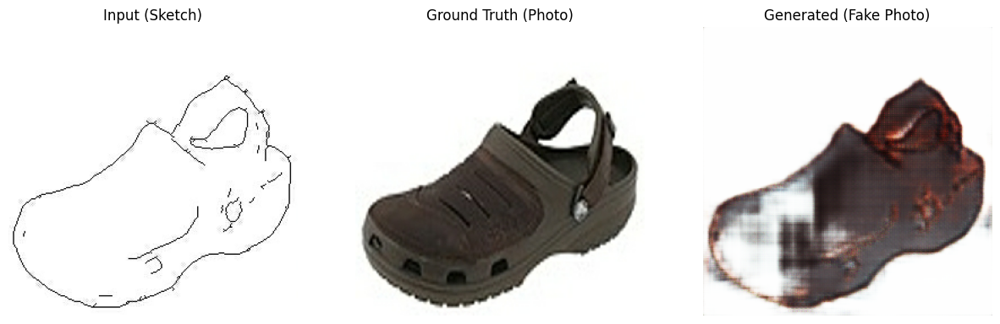

Epoch: 23


Epoch 23: 100%|██████████| 100/100 [00:20<00:00,  4.89it/s]


Time for epoch 23 is 20.992998838424683 sec



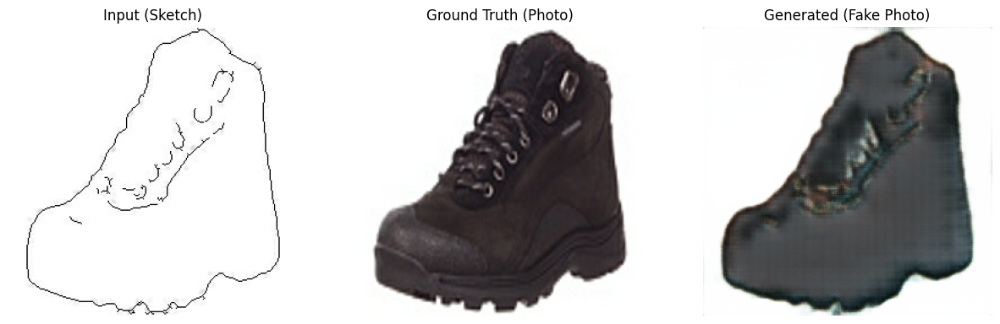

Epoch: 24


Epoch 24: 100%|██████████| 100/100 [00:16<00:00,  5.92it/s]


Time for epoch 24 is 17.38817000389099 sec



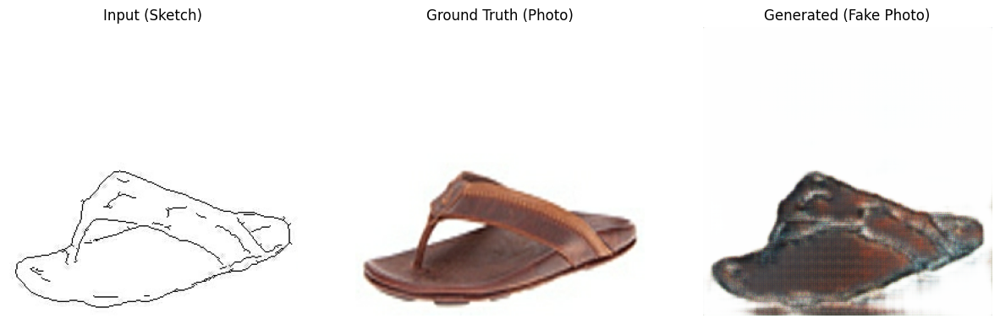

Epoch: 25


Epoch 25: 100%|██████████| 100/100 [00:18<00:00,  5.50it/s]


Time for epoch 25 is 18.70591163635254 sec



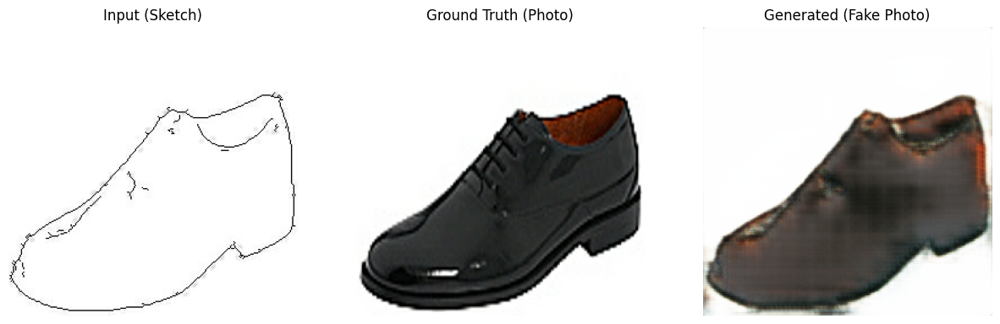

Epoch: 26


Epoch 26: 100%|██████████| 100/100 [00:17<00:00,  5.75it/s]


Time for epoch 26 is 18.098289728164673 sec



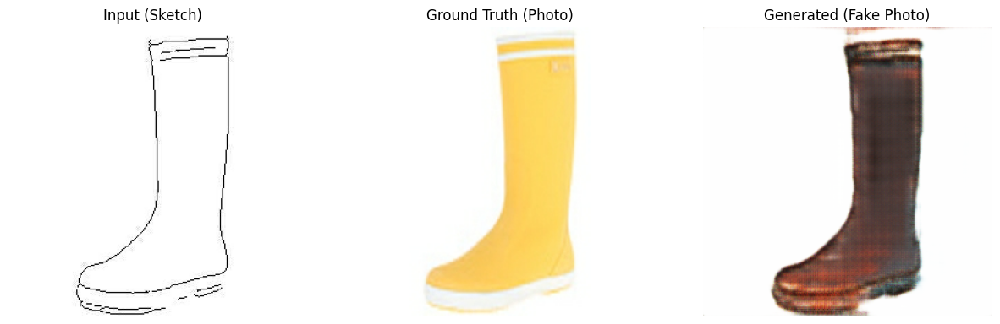

Epoch: 27


Epoch 27: 100%|██████████| 100/100 [00:17<00:00,  5.58it/s]


Time for epoch 27 is 18.392845153808594 sec



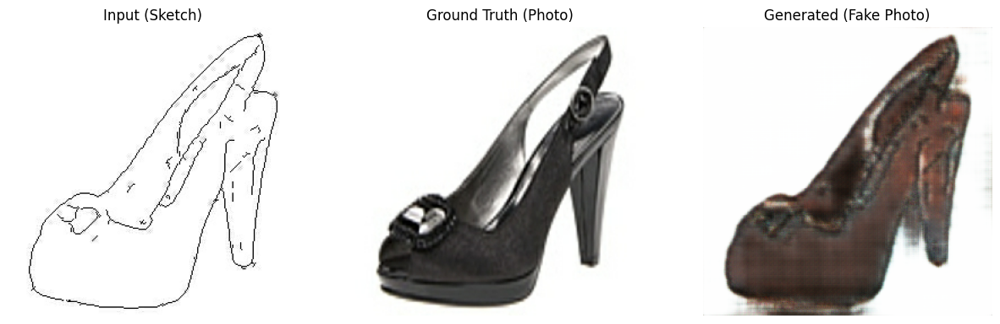

Epoch: 28


Epoch 28: 100%|██████████| 100/100 [00:18<00:00,  5.49it/s]


Time for epoch 28 is 18.876559257507324 sec



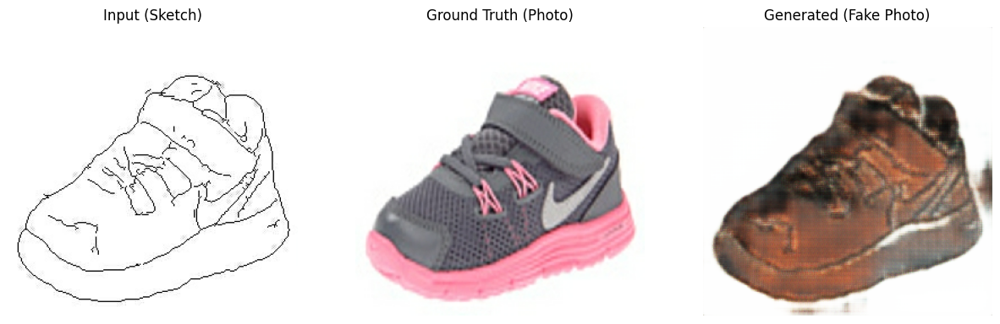

Epoch: 29


Epoch 29: 100%|██████████| 100/100 [00:17<00:00,  5.61it/s]


Time for epoch 29 is 18.504489421844482 sec



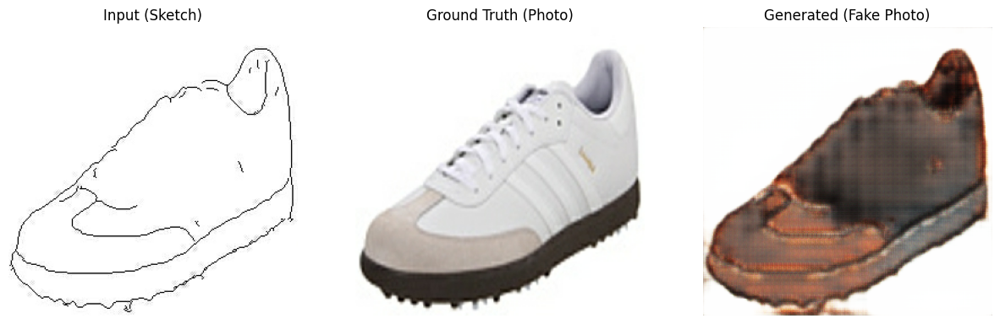

Epoch: 30


Epoch 30: 100%|██████████| 100/100 [00:18<00:00,  5.31it/s]


Time for epoch 30 is 19.372743368148804 sec



In [18]:
# Run Training
EPOCHS = 30   # start small for testing
fit(train_dataset, EPOCHS, test_dataset)

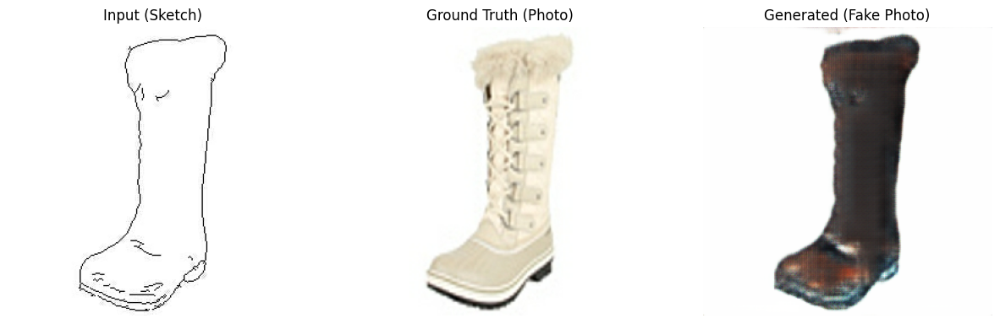

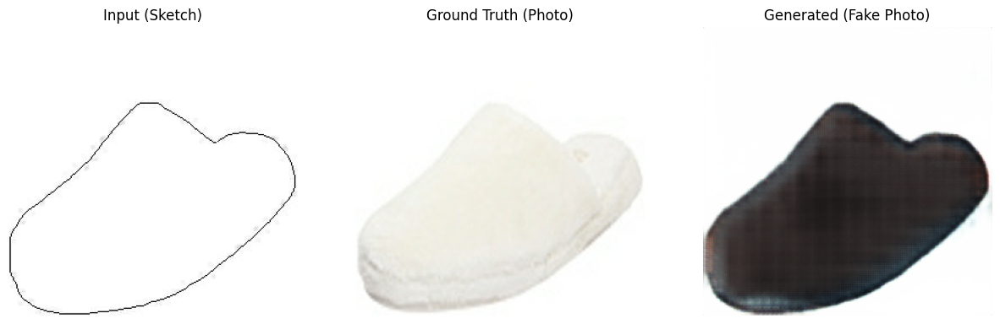

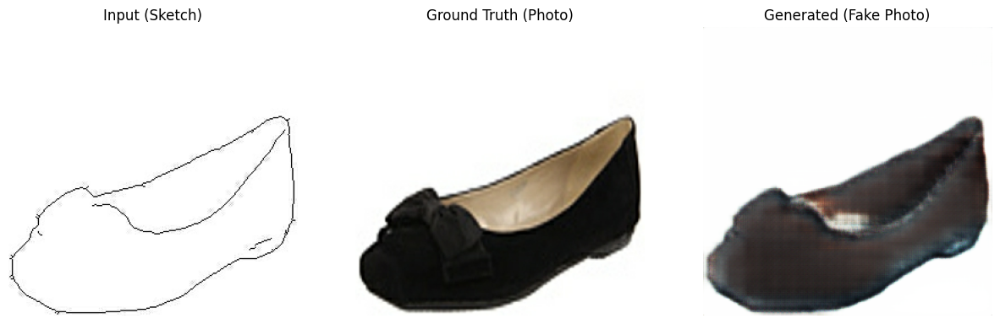

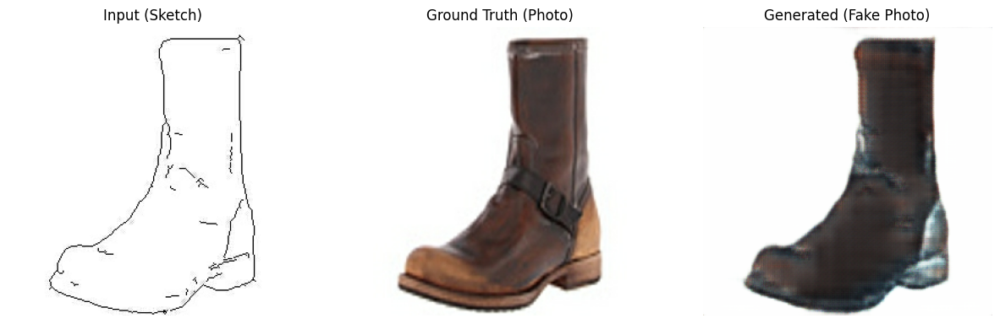

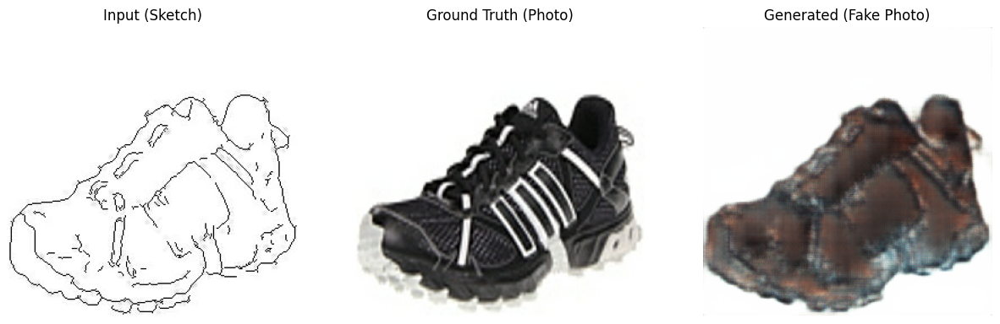

In [19]:
# Test After Training
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)